##Import necessary libraries

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, window, current_timestamp
from pyspark.sql.types import StructType, StructField, StringType, IntegerType, TimestampType

##Initialize Spark session

In [0]:
spark = SparkSession.builder.appName("AQIStreaming").getOrCreate()

##Define the schema for the AQI data

In [0]:
schema = StructType([
    StructField("`city_name`", StringType(), True),
    StructField("`main.aqi`", IntegerType(), True),
    StructField("`datetime`", TimestampType(), True)
])


##Read static data from November 2023 and add a current timestamp column to simulate streaming


In [0]:
static_data_november = spark.read.csv("dbfs:/FileStore/shared_uploads/rahuldahiya67@gmail.com/202311_CombinedData.csv", header=True, inferSchema=True)
streaming_data_november = static_data_november.withColumn("`datetime`", current_timestamp())
streaming_data_november.createOrReplaceTempView("aqi_streaming_table_november")


##Define a window specification for 1-hour intervals

In [0]:
window_spec = window("`datetime`", "1 hour")

##Aggregate AQI data for November 2023

In [0]:
agg_data_november = spark.sql("""
    SELECT window(`datetime`, '1 hour') as window, `city_name`, AVG(`main.aqi`) as avg_aqi 
    FROM aqi_streaming_table_november 
    GROUP BY window(`datetime`, '1 hour'), `city_name`
""")
display(agg_data_november)

window,city_name,avg_aqi
"List(2023-11-06T07:00:00.000+0000, 2023-11-06T08:00:00.000+0000)",Santa Rosa,1.0
"List(2023-11-07T16:00:00.000+0000, 2023-11-07T17:00:00.000+0000)",Victorias,1.0
"List(2023-11-08T16:00:00.000+0000, 2023-11-08T17:00:00.000+0000)",Bayawan,1.0
"List(2023-11-08T22:00:00.000+0000, 2023-11-08T23:00:00.000+0000)",Ormoc,1.0
"List(2023-11-08T22:00:00.000+0000, 2023-11-08T23:00:00.000+0000)",Puerto Princesa City,1.0
"List(2023-11-09T04:00:00.000+0000, 2023-11-09T05:00:00.000+0000)",Borongan,1.0
"List(2023-11-09T10:00:00.000+0000, 2023-11-09T11:00:00.000+0000)",Canlaon,1.0
"List(2023-11-09T10:00:00.000+0000, 2023-11-09T11:00:00.000+0000)",Naga,1.0
"List(2023-11-09T22:00:00.000+0000, 2023-11-09T23:00:00.000+0000)",Vigan,1.0
"List(2023-11-10T16:00:00.000+0000, 2023-11-10T17:00:00.000+0000)",Ilagan,2.0


##Read static data from December 2023 and simulate streaming

In [0]:
static_data_december = spark.read.csv("dbfs:/FileStore/shared_uploads/rahuldahiya67@gmail.com/202312_CombinedData.csv", header=True, inferSchema=True)
streaming_data_december = static_data_december.withColumn("`datetime`", current_timestamp())
streaming_data_december.createOrReplaceTempView("aqi_streaming_table_december")


##Aggregate AQI data for December 2023

In [0]:
agg_data_december = spark.sql("""
    SELECT window(`datetime`, '1 hour') as window, `city_name`, AVG(`main.aqi`) as avg_aqi 
    FROM aqi_streaming_table_december 
    GROUP BY window(`datetime`, '1 hour'), `city_name`
""")
display(agg_data_december)

window,city_name,avg_aqi
"List(2023-12-03T00:00:00.000+0000, 2023-12-03T01:00:00.000+0000)",Naga,2.0
"List(2023-12-03T02:00:00.000+0000, 2023-12-03T03:00:00.000+0000)",General Trias,3.0
"List(2023-12-03T04:00:00.000+0000, 2023-12-03T05:00:00.000+0000)",San Carlos,2.0
"List(2023-12-03T10:00:00.000+0000, 2023-12-03T11:00:00.000+0000)",Bais,1.0
"List(2023-12-03T10:00:00.000+0000, 2023-12-03T11:00:00.000+0000)",Dasmariñas,1.0
"List(2023-12-03T10:00:00.000+0000, 2023-12-03T11:00:00.000+0000)",Tuguegarao,2.0
"List(2023-12-03T22:00:00.000+0000, 2023-12-03T23:00:00.000+0000)",Bacoor,2.0
"List(2023-12-04T16:00:00.000+0000, 2023-12-04T17:00:00.000+0000)",Angeles City,2.0
"List(2023-12-04T22:00:00.000+0000, 2023-12-04T23:00:00.000+0000)",Danao,1.0
"List(2023-12-04T22:00:00.000+0000, 2023-12-04T23:00:00.000+0000)",Tanjay,1.0


##Calculate rolling average for each city

In [0]:
rolling_avg_data = spark.sql("""
    SELECT 
        `datetime`,
        `city_name`,
        `main.aqi`,
        AVG(`main.aqi`) OVER (PARTITION BY `city_name` ORDER BY `datetime` ROWS BETWEEN 2 PRECEDING AND CURRENT ROW) as rolling_avg_aqi
    FROM aqi_streaming_table_november
""")

##Calculate Z-scores to identify anomalies

In [0]:
z_score_data = spark.sql("""
    SELECT 
        `datetime`,
        `city_name`,
        `main.aqi`,
        (`main.aqi` - AVG(`main.aqi`) OVER (PARTITION BY `city_name`)) / STDDEV_POP(`main.aqi`) OVER (PARTITION BY `city_name`) as z_score
    FROM aqi_streaming_table_november
""")
anomalies = z_score_data.filter("ABS(z_score) > 3")
display(anomalies)

datetime,city_name,main.aqi,z_score
2023-11-06T07:52:25.000+0000,Bacoor,5.0,3.3705693019182075
2023-11-09T04:00:21.000+0000,Bacoor,5.0,3.3705693019182075
2023-11-10T04:00:13.000+0000,Bacoor,5.0,3.3705693019182075
2023-11-22T04:00:18.000+0000,Bacoor,5.0,3.3705693019182075
2023-11-17T10:00:51.000+0000,Batac City,3.0,3.0367431846905597
2023-11-17T22:00:44.000+0000,Batac City,3.0,3.0367431846905597
2023-11-18T01:00:28.000+0000,Batac City,3.0,3.0367431846905597
2023-11-13T22:00:39.000+0000,Bayugan,2.0,10.583005244258365
2023-11-13T10:01:15.000+0000,Cabadbaran,2.0,10.53565375285274
2023-11-23T19:00:49.000+0000,Cabanatuan City,4.0,3.874433949756645


##Calculate trends in AQI data for each city

In [0]:
trend_data = spark.sql("""
    SELECT 
        `datetime`,
        `city_name`,
        `main.aqi`,
        `main.aqi` - FIRST_VALUE(`main.aqi`) OVER (PARTITION BY `city_name` ORDER BY `datetime`) as trend
    FROM aqi_streaming_table_november
""")
display(trend_data)

datetime,city_name,main.aqi,trend
2023-11-06T07:52:19.000+0000,Alaminos,2.0,0.0
2023-11-06T10:07:01.000+0000,Alaminos,2.0,0.0
2023-11-06T16:07:00.000+0000,Alaminos,2.0,0.0
2023-11-06T22:07:01.000+0000,Alaminos,1.0,-1.0
2023-11-07T04:07:00.000+0000,Alaminos,3.0,1.0
2023-11-07T10:07:00.000+0000,Alaminos,2.0,0.0
2023-11-07T16:07:00.000+0000,Alaminos,2.0,0.0
2023-11-07T22:07:01.000+0000,Alaminos,1.0,-1.0
2023-11-08T01:39:26.000+0000,Alaminos,2.0,0.0
2023-11-08T04:00:01.000+0000,Alaminos,2.0,0.0


##Display aggregated AQI data for November

In [0]:
display(agg_data_november)

window,city_name,avg_aqi
"List(2023-11-06T07:00:00.000+0000, 2023-11-06T08:00:00.000+0000)",Santa Rosa,1.0
"List(2023-11-07T16:00:00.000+0000, 2023-11-07T17:00:00.000+0000)",Victorias,1.0
"List(2023-11-08T16:00:00.000+0000, 2023-11-08T17:00:00.000+0000)",Bayawan,1.0
"List(2023-11-08T22:00:00.000+0000, 2023-11-08T23:00:00.000+0000)",Ormoc,1.0
"List(2023-11-08T22:00:00.000+0000, 2023-11-08T23:00:00.000+0000)",Puerto Princesa City,1.0
"List(2023-11-09T04:00:00.000+0000, 2023-11-09T05:00:00.000+0000)",Borongan,1.0
"List(2023-11-09T10:00:00.000+0000, 2023-11-09T11:00:00.000+0000)",Canlaon,1.0
"List(2023-11-09T10:00:00.000+0000, 2023-11-09T11:00:00.000+0000)",Naga,1.0
"List(2023-11-09T22:00:00.000+0000, 2023-11-09T23:00:00.000+0000)",Vigan,1.0
"List(2023-11-10T16:00:00.000+0000, 2023-11-10T17:00:00.000+0000)",Ilagan,2.0


##Visualize real-time AQI trends using matplotlib##

<AxesSubplot:title={'center':'main.aqi'}, xlabel='city_name'>

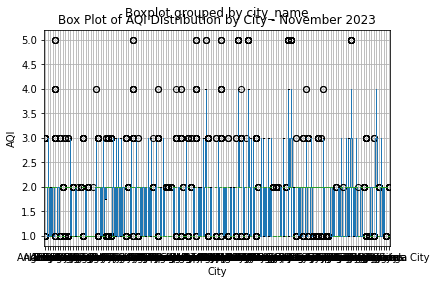

In [0]:
# Visualization 1: Box Plot for AQI Distribution by City
display(streaming_data_november_pd.boxplot(column='main.aqi', by='city_name'))
plt.title('Box Plot of AQI Distribution by City - November 2023')
plt.ylabel('AQI')
plt.xlabel('City')
plt.show()


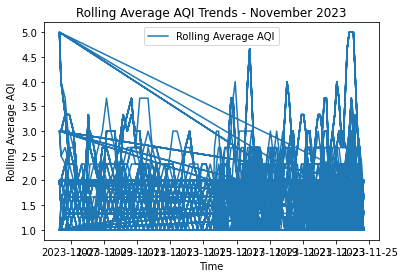

In [0]:
# Visualization 2: Line Chart for Rolling Average AQI
rolling_avg_data_pd = rolling_avg_data.toPandas()
plt.plot(rolling_avg_data_pd['datetime'], rolling_avg_data_pd['rolling_avg_aqi'], label='Rolling Average AQI')
plt.xlabel('Time')
plt.ylabel('Rolling Average AQI')
plt.title('Rolling Average AQI Trends - November 2023')
plt.legend()
plt.show()

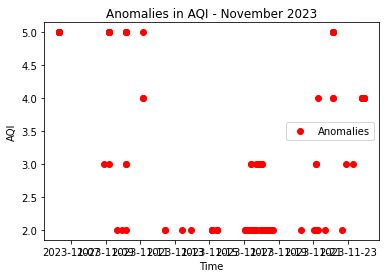

In [0]:
# Visualization 3: Scatter Plot for Anomalies
anomalies_pd = anomalies.toPandas()
plt.scatter(anomalies_pd['datetime'], anomalies_pd['main.aqi'], c='red', label='Anomalies')
plt.xlabel('Time')
plt.ylabel('AQI')
plt.title('Anomalies in AQI - November 2023')
plt.legend()
plt.show()

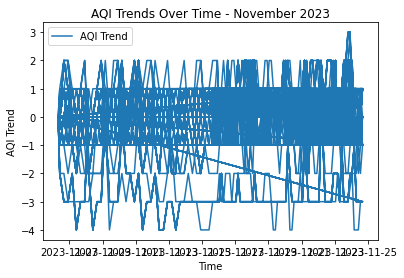

In [0]:
# Visualization 4: Trend Chart for AQI Trends Over Time
trend_data_pd = trend_data.toPandas()
plt.plot(trend_data_pd['datetime'], trend_data_pd['trend'], label='AQI Trend')
plt.xlabel('Time')
plt.ylabel('AQI Trend')
plt.title('AQI Trends Over Time - November 2023')
plt.legend()
plt.show()

##Display aggregated AQI data for November with Databricks' visualization options


In [0]:
display(agg_data_november, plotOptions={'updateInterval': 1000, 'height': 400})

window,city_name,avg_aqi
"List(2023-11-06T07:00:00.000+0000, 2023-11-06T08:00:00.000+0000)",Santa Rosa,1.0
"List(2023-11-07T16:00:00.000+0000, 2023-11-07T17:00:00.000+0000)",Victorias,1.0
"List(2023-11-08T16:00:00.000+0000, 2023-11-08T17:00:00.000+0000)",Bayawan,1.0
"List(2023-11-08T22:00:00.000+0000, 2023-11-08T23:00:00.000+0000)",Ormoc,1.0
"List(2023-11-08T22:00:00.000+0000, 2023-11-08T23:00:00.000+0000)",Puerto Princesa City,1.0
"List(2023-11-09T04:00:00.000+0000, 2023-11-09T05:00:00.000+0000)",Borongan,1.0
"List(2023-11-09T10:00:00.000+0000, 2023-11-09T11:00:00.000+0000)",Canlaon,1.0
"List(2023-11-09T10:00:00.000+0000, 2023-11-09T11:00:00.000+0000)",Naga,1.0
"List(2023-11-09T22:00:00.000+0000, 2023-11-09T23:00:00.000+0000)",Vigan,1.0
"List(2023-11-10T16:00:00.000+0000, 2023-11-10T17:00:00.000+0000)",Ilagan,2.0
